<a href="https://colab.research.google.com/github/luizcyrico/projeto/blob/master/MaskRCNN_Pytorch_Train_MARCO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. CONECTAR NOTEBOOK AO SEU GOOGLE DRIVE

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---
# 2. INSTALAR O DETECTRON2

In [2]:
!pip install pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
#exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=1324fd4d5c58dc6dbd4db7f57408b84f5122258f8a1a6a7e78d24a8afb3e177d
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 184 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu111
    Uninstalling torch-1.9.0+cu111:
      Successfully uninstalled torch-1.9.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu111
    Uninstalling torchvision-0.10.0+cu111:
      Successf

***----------!!! DEPOIS DE INSTALAR O DETECTRON2 É NECESSÁRIO FAZER RESTART DO RUNTIME DO NOTEBOOK !!!----------***

---



# 3. IMPORTAR AS BIBLIOTECAS

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version

1.8.0+cu101 True


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

---
# 4. PREPARAR O DATASET

## 4.1 REGISTRAR O DATASET

In [3]:
from detectron2.data.datasets import register_coco_instances
#register_coco_instances("fractures_train", {}, "/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/dataset/train/instances_train.json", "/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/dataset/train/image/")
#register_coco_instances("fractures_test", {}, "/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/dataset/test/instances_test.json", "/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/dataset/test/image/")


register_coco_instances("fractures_train", {}, "/content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/train/instances_train.json", "/content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/train/image/")
register_coco_instances("fractures_test", {}, "/content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/test/instances_test.json", "/content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/test/image/")


In [4]:
fracture_metadata = MetadataCatalog.get("fractures_train")
fracture_metadata_test = MetadataCatalog.get("fractures_test")

In [5]:
dataset_dicts = DatasetCatalog.get("fractures_train")
test_dicts = DatasetCatalog.get("fractures_test")

[10/12 10:15:27 d2.data.datasets.coco]: Loaded 1208 images in COCO format from /content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/train/instances_train.json
[10/12 10:15:27 d2.data.datasets.coco]: Loaded 302 images in COCO format from /content/drive/MyDrive/Luiz Carlos/MaskRCNN/dataset/test/instances_test.json


## 4.2 VISUALIZAR UMA AMOSTRA DAS IMAGENS

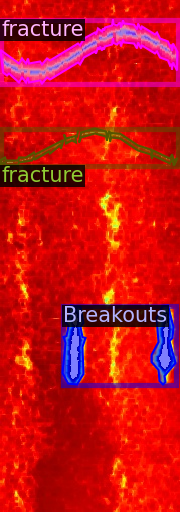

In [6]:
import random
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

plt.rcParams['figure.dpi'] = 150

for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fracture_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    print('')

---
# 5. TREINAR O MODELO

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fractures_train",)
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl")#/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/model_final_f10217.pkl")#"detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = (
    8000
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    128
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # 3 classes (data, fig, hazelnut)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/11 16:54:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

R-50.pkl: 102MB [00:04, 24.8MB/s]                           


[10/11 16:54:39 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......
[10/11 16:54:39 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up:
| Names in Model    | Names in Checkpoint      | Shapes                                          |
|:------------------|:-------------------------|:------------------------------------------------|
| res2.0.conv1.*    | res2_0_branch2a_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| res2.0.conv2.*    | res2_0_branch2b_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.0.conv3.*    | res2_0_branch2c_{bn_*,w} | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.0.shortcut.* | res2_0_branch1_{bn_*,w}  | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.1.conv1.*    | res2_1_branch2a_{bn_*,w} | (64,) (64,) (64,) (64,) (64,256,1,1)            |
| res2.1.conv2.*    | res2_1_branch2b_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.1.conv3.*  

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.deconv.{bias, weight}
roi_heads.mask_head.mask_fcn1.{bias, weight}
roi_heads.mask_head.mask_fcn2.{bias, weight}
roi_heads.mask_head.mask_fcn3.{bias, weight}
roi_heads.mask_head.mask_fcn4.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
The checkpoint state_dict contains 

[10/11 16:54:39 d2.engine.train_loop]: Starting training from iteration 0
[10/11 16:55:03 d2.utils.events]:  eta: 2:49:01  iter: 19  total_loss: 1.67  loss_cls: 0.2757  loss_box_reg: 0.03946  loss_mask: 0.6786  loss_rpn_cls: 0.6669  loss_rpn_loc: 0.0287  time: 1.1908  data_time: 0.0294  lr: 0.00039962  max_mem: 2674M
[10/11 16:55:29 d2.utils.events]:  eta: 2:46:19  iter: 39  total_loss: 1.552  loss_cls: 0.3542  loss_box_reg: 0.4918  loss_mask: 0.4606  loss_rpn_cls: 0.1372  loss_rpn_loc: 0.02479  time: 1.2341  data_time: 0.0081  lr: 0.00079922  max_mem: 2759M
[10/11 16:55:54 d2.utils.events]:  eta: 2:46:15  iter: 59  total_loss: 1.703  loss_cls: 0.415  loss_box_reg: 0.695  loss_mask: 0.4024  loss_rpn_cls: 0.07408  loss_rpn_loc: 0.02437  time: 1.2458  data_time: 0.0077  lr: 0.0011988  max_mem: 2759M
[10/11 16:56:20 d2.utils.events]:  eta: 2:47:50  iter: 79  total_loss: 1.577  loss_cls: 0.4121  loss_box_reg: 0.6742  loss_mask: 0.3881  loss_rpn_cls: 0.04758  loss_rpn_loc: 0.02734  time: 1.

## 5.1 COPIAR ARQUIVOS DE TREINO PARA O DRIVE

In [10]:
!cp -r /content/output '/content/drive/MyDrive/Colab Notebooks/Luiz Carlos/MaskRCNN/output/'

cp: cannot stat '/content/output': No such file or directory


---
# 6. FAZER INFERENCIA (PREDICT) DO MODELO

In [9]:
#cfg.MODEL.WEIGHTS = os.path.join('/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/output/', "model_final.pth")

cfg.MODEL.WEIGHTS = os.path.join('/content/drive/MyDrive/Luiz Carlos/MaskRCNN/output/', "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("fractures_test", )
predictor = DefaultPredictor(cfg)

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


## 6.1 VISUALIZAR OS RESULTADOS

In [21]:
masked_gt.shape

NameError: ignored

NameError: ignored

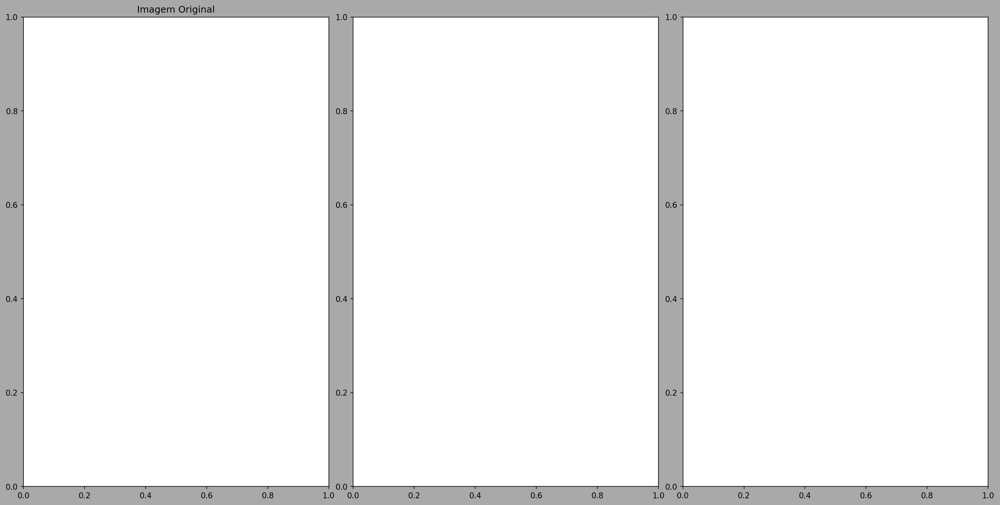

In [18]:

fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 9), facecolor='darkgray')
#gs1 = gridspec.GridSpec(1, 3)
fig.tight_layout(h_pad=2, w_pad=0.05)
ax1.title.set_text('Imagem Original')
ax1.imshow(mask, interpolation='none') #cmap='gray', img_gt[:,:,0]
ax2.title.set_text('Imagem Original')

ax2.imshow(masked_gt, interpolation='none') #cmap='gray', 

NameError: ignored

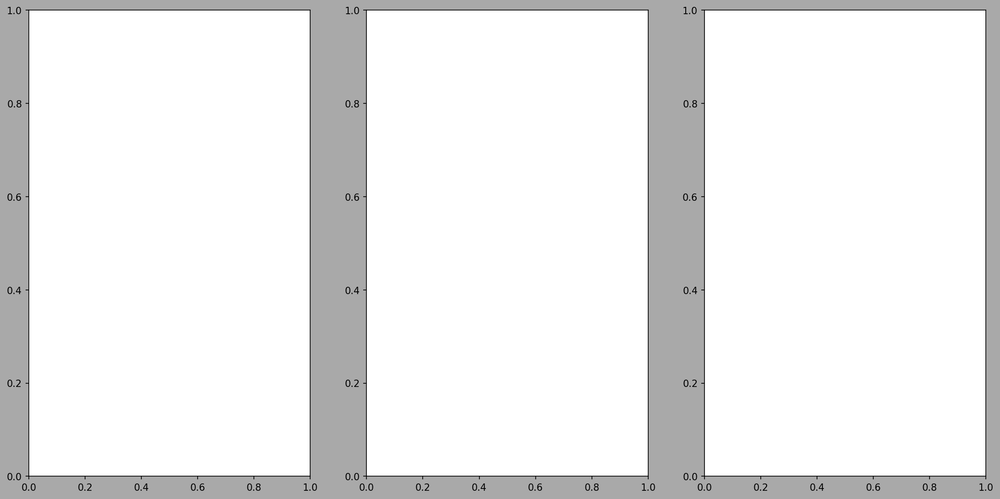

In [ ]:
    fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 9), facecolor='darkgray')
    gs1 = gridspec.GridSpec(1, 3)
    gs1.update(wspace=0.025, hspace=0.05)
    fig.tight_layout(h_pad=2, w_pad=0.05)
    ax1.title.set_text('Imagem Original')
    ax1.imshow(cv2.resize(im, (400, 600), interpolation = cv2.INTER_AREA), interpolation='none') #cmap='gray', 
    ax2.title.set_text('Segmentação Real')
    ax2.imshow(cv2.resize(v_gt.get_image()[:, :, ::-1], (400, 600), interpolation = cv2.INTER_AREA) , cmap='gray', interpolation='none') 
    ax3.title.set_text('Segmentação do Modelo')
    ax3.imshow(cv2.resize(v_pred.get_image()[:, :, ::-1], (400, 600), interpolation = cv2.INTER_AREA) , cmap='gray', interpolation='none')
    plt.savefig(f'/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/Resultados/figura_{i}.png', dpi=200)
    print('')

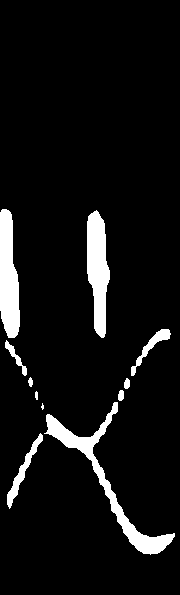

In [ ]:
mask

TypeError: ignored

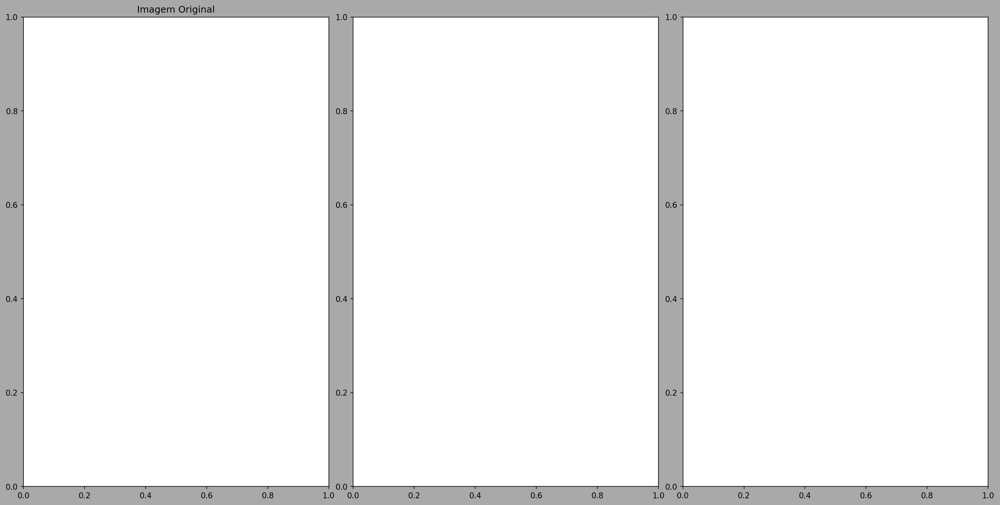

In [ ]:


fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 9), facecolor='darkgray')
gs1 = gridspec.GridSpec(1, 3)
gs1.update(wspace=0.025, hspace=0.05)
fig.tight_layout(h_pad=2, w_pad=0.05)
ax1.title.set_text('Imagem Original')
ax1.imshow(cv2.resize(mask, (400, 600), interpolation = cv2.INTER_AREA), interpolation='none') #cmap='gray', 

In [ ]:
mask = np.array(outputs["instances"].to("cpu").get("pred_masks"))[0,:,:]
if np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0] > 1:
        for segment in range(1, np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0]):
            mask = mask+np.array(outputs["instances"].to("cpu").get("pred_masks"))[segment,:,:]

mask = np.expand_dims(mask, axis=2)
mask.shape

(462, 180, 1)

In [ ]:
mask = np.expand_dims(mask, axis=2)
mask.shape

(462, 180, 1, 1, 1)

4874580
0
inf


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app


TypeError: ignored

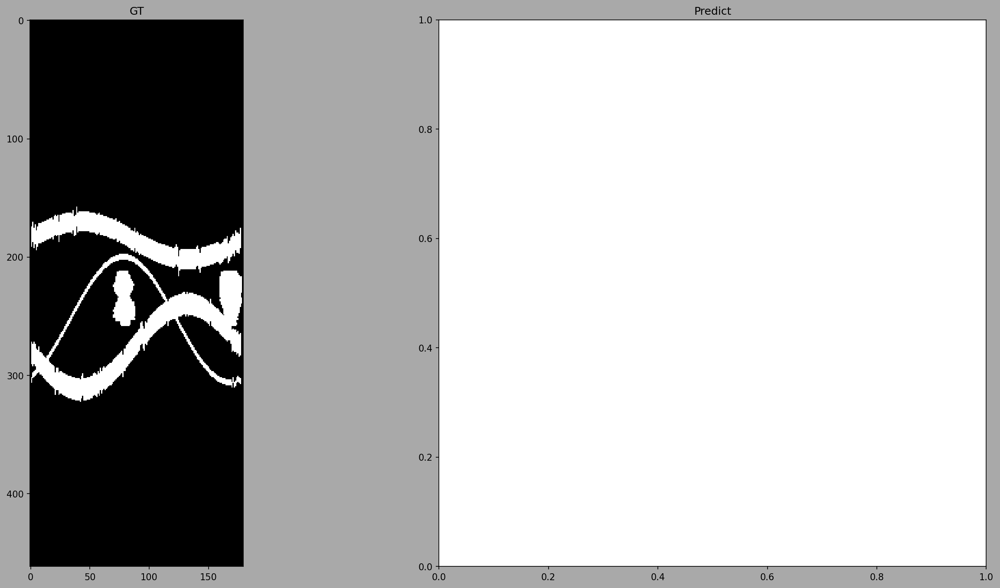

In [ ]:
mask = np.array(outputs["instances"].to("cpu").get("pred_masks"))[0,:,:]
if np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0] > 1:
        for segment in range(1, np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0]):
            mask = mask+np.array(outputs["instances"].to("cpu").get("pred_masks"))[segment,:,:]
#mask=Image.fromarray(mask)
mask = np.expand_dims(mask, axis=-1)
mask = np.array(mask)
mask = np.ma.masked_where(mask == 0, mask)
#print(mask.shape)
overlap = masked_gt*mask # Logical AND
print(overlap.sum())
union = masked_gt+mask # Logical OR
print(union.sum())

print(overlap.sum()/float(union.sum()))
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(18, 9), facecolor='darkgray')
gs1 = gridspec.GridSpec(1, 2)
gs1.update(wspace=0.025, hspace=0.05)
fig.tight_layout(h_pad=2, w_pad=0.05)
ax1.title.set_text('GT')
ax1.imshow(masked_gt, interpolation='none', cmap='gray') 
ax2.title.set_text('Predict')
ax2.imshow(mask, interpolation='none', cmap='gray') 

In [ ]:
fileList = !ls '/content/drive/MyDrive/Colab Notebooks/LuizCarlos/dataset/images/'
len(fileList)
print(f"METRICA MEDIA IOU: {np.mean(meanIOU)} para {i} imagens")

1500

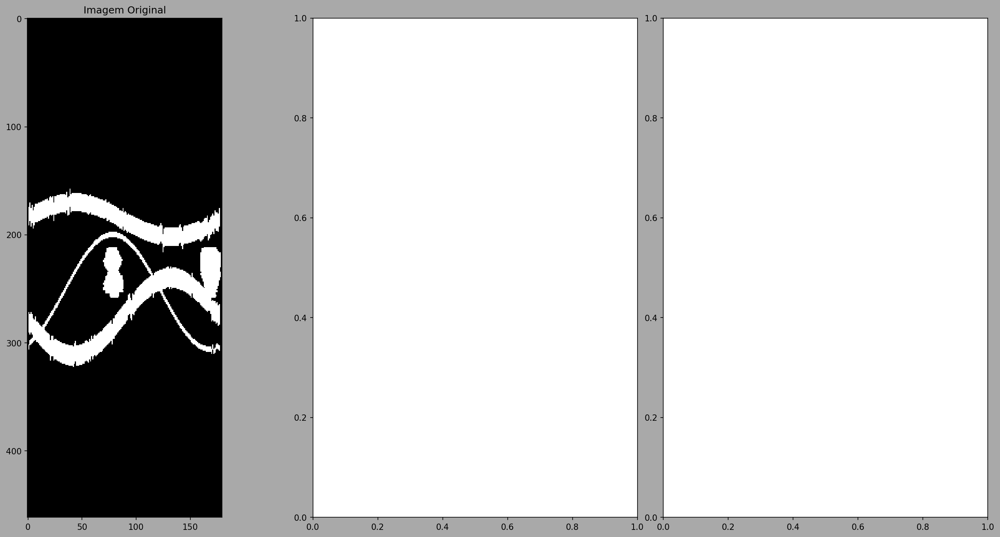

In [ ]:
fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 9), facecolor='darkgray')
gs1 = gridspec.GridSpec(1, 3)
gs1.update(wspace=0.025, hspace=0.05)
fig.tight_layout(h_pad=2, w_pad=0.05)
ax1.title.set_text('Imagem Original')
ax1.imshow(masked_gt[:,:,:], interpolation='none') #cmap='gray', 

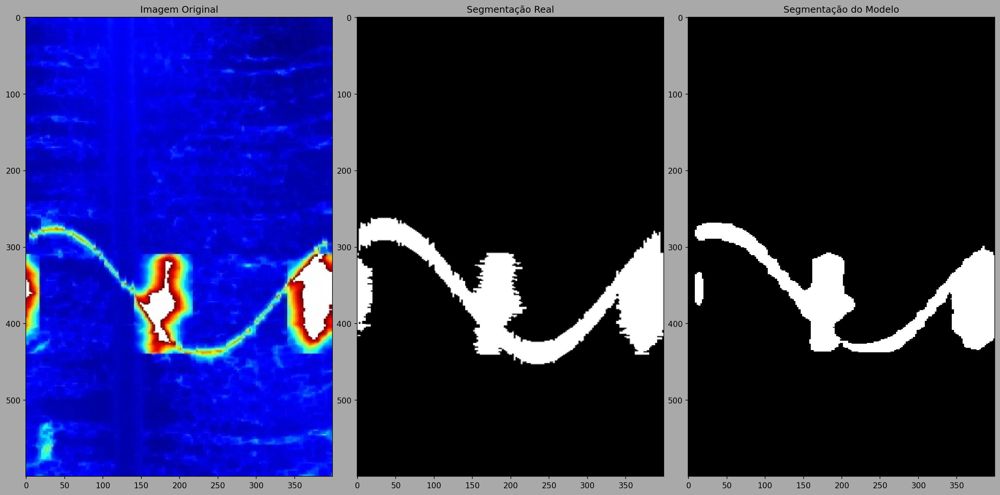

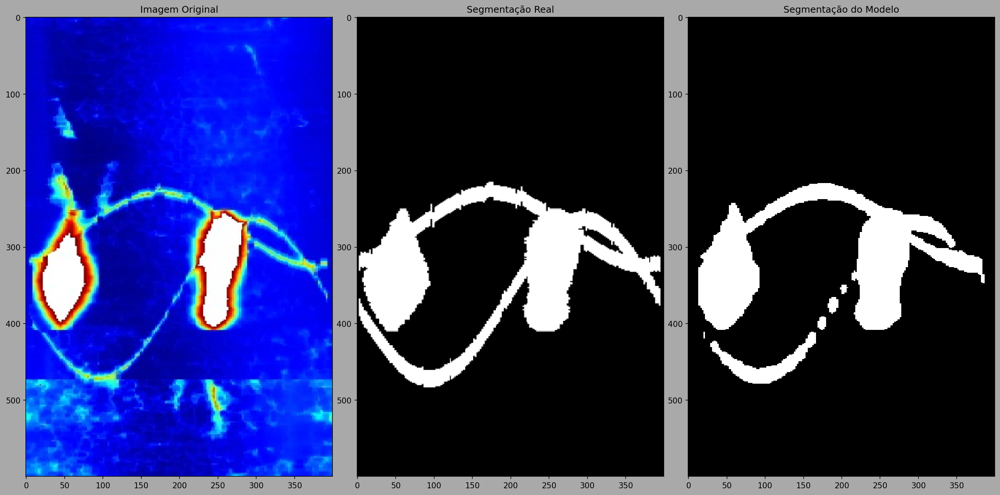

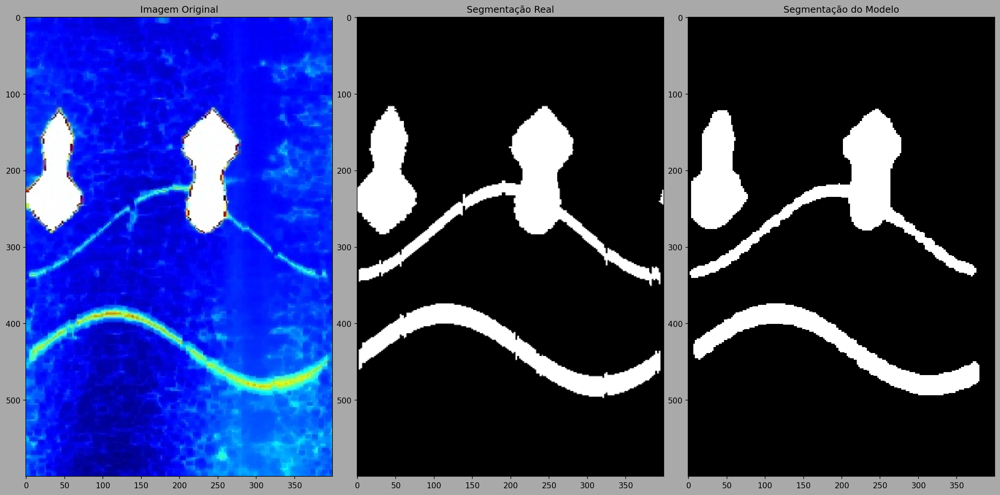

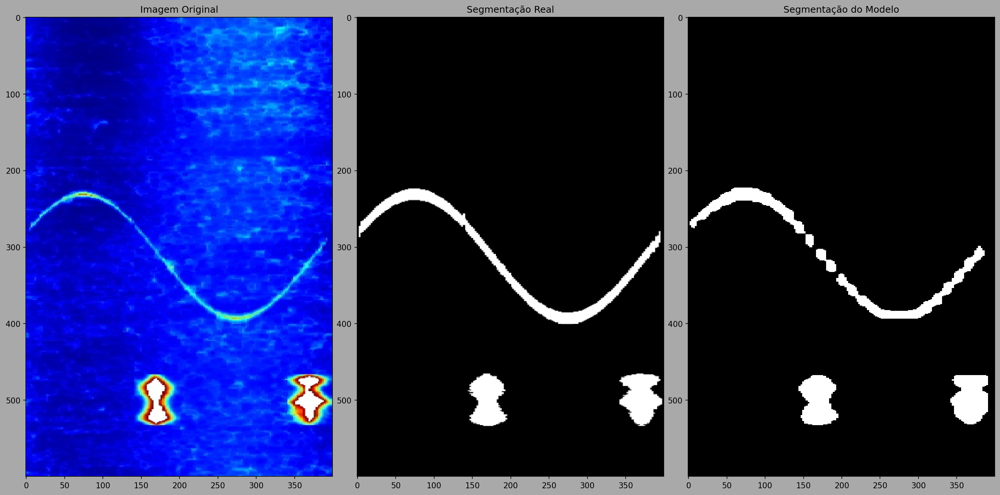

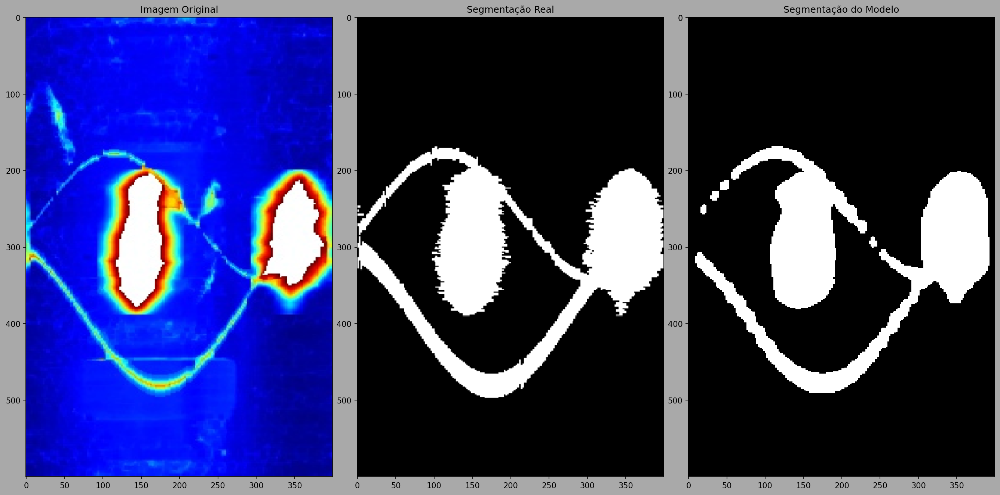

In [ ]:
import PIL
from PIL import Image
import matplotlib.gridspec as gridspec
from detectron2.utils.visualizer import ColorMode
from tensorflow.keras.preprocessing.image import load_img
i=0
meanIOU = []
for d in random.sample(test_dicts, 5):#test_dicts:
    i+=1    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    visualizer_gt = Visualizer(np.zeros(im[:, :, ::-1].shape)[:, :, ::-1],
                               metadata=fracture_metadata_test,
                               scale=0.8,
                               instance_mode=ColorMode.IMAGE_BW)
    v_gt = visualizer_gt.draw_dataset_dict(d)
    visualizer_pred = Visualizer(np.zeros(im[:, :, ::-1].shape)[:, :, ::-1],
                   metadata=fracture_metadata_test, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW)
    v_pred = visualizer_pred.draw_instance_predictions(outputs["instances"].to("cpu"))


    img_gt = PIL.ImageOps.autocontrast(load_img('/content/drive/MyDrive/Colab Notebooks/LuizCarlos/dataset/comp_masks/'+d["file_name"].split('/')[-1].split('.')[0]+'.png'))
    img_gt = np.array(img_gt)
    masked_gt = np.ma.masked_where(img_gt == 0, img_gt)

    mask = np.array(outputs["instances"].to("cpu").get("pred_masks"))[0,:,:]
    if np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0] > 1:
        for segment in range(1, np.array(outputs["instances"].to("cpu").get("pred_masks")).shape[0]):
            mask = mask+np.array(outputs["instances"].to("cpu").get("pred_masks"))[segment,:,:]

    mask=Image.fromarray(mask)
    overlap = masked_gt[:,:,0]*mask # Logical AND
    union = masked_gt[:,:,0]+mask # Logical OR
    
    IOU = overlap.sum()/float(union.sum())
    meanIOU.append(IOU)
    
    fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 9), facecolor='darkgray')
    gs1 = gridspec.GridSpec(1, 3)
    gs1.update(wspace=0.025, hspace=0.05)
    fig.tight_layout(h_pad=2, w_pad=0.05)
    ax1.title.set_text('Imagem Original')
    ax1.imshow(cv2.resize(im, (400, 600), interpolation = cv2.INTER_AREA), interpolation='none') #cmap='gray', 
    ax2.title.set_text('Segmentação Real')
    ax2.imshow(cv2.resize(masked_gt, (400, 600), interpolation = cv2.INTER_AREA) , cmap='gray', interpolation='none') 
    ax3.title.set_text('Segmentação do Modelo')
    ax3.imshow(mask.resize((400, 600)) , cmap='gray', interpolation='none')
    plt.savefig(f'/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/Resultados/figura_{i}.png', dpi=200)
    print('')



## 6.2 AVALIAR PERFORMANCE DO MODELO (METRICAS)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("fractures_test1", ("bbox","segm"), False, output_dir="./output/") #"bbox", 
val_loader = build_detection_test_loader(cfg, "fractures_test1")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

ModuleNotFoundError: ignored

In [ ]:
!cp -r /content/output '/content/drive/MyDrive/LuizCarlos/MaskRCNN/output/'

cp: cannot create directory '/content/drive/MyDrive/LuizCarlos/MaskRCNN/output/': No such file or directory


## 6.3 VISUALIZAR COMPORTAMENTO DO MODELO DURANTE TREINO COM O TENSORBOARD

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 615), started 0:00:43 ago. (Use '!kill 615' to kill it.)

<IPython.core.display.Javascript object>

---
# 7. CARREGAR O MODELO SALVO


In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join('/content/drive/MyDrive/Colab Notebooks/LuizCarlos/MaskRCNN/output/', "model_final.pth")#', "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

AssertionError: ignored

---
# 8. FAZER INFERENCIA DO MODELO SALVO PARA NOVAS IMAGENS

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

NameError: ignored

In [ ]:
def metricaIOU(i):
    img_gt = PIL.ImageOps.autocontrast(load_img(val_target_img_paths[i]))
    img_gt = img_gt.resize((160,160))
    masked_gt = np.ma.masked_where(img_gt == 0, img_gt)

    mask = np.argmax(val_preds[i], axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    overlap = img_gt*mask # Logical AND
    union = img_gt + mask # Logical OR

    IOU = overlap.sum()/float(union.sum())
    return IOU


meanIOU = []
for i in range(0, len(val_preds)):
    meanIOU.append(metricaIOU(i))

print(f"METRICA MEDIA IOU: {np.mean(meanIOU)} para {i} imagens")



In [ ]:
help(detectron2.evaluation.SemSegEvaluator)

Help on class SemSegEvaluator in module detectron2.evaluation.sem_seg_evaluation:

class SemSegEvaluator(detectron2.evaluation.evaluator.DatasetEvaluator)
 |  SemSegEvaluator(dataset_name, distributed=True, output_dir=None, *, num_classes=None, ignore_label=None)
 |  
 |  Evaluate semantic segmentation metrics.
 |  
 |  Method resolution order:
 |      SemSegEvaluator
 |      detectron2.evaluation.evaluator.DatasetEvaluator
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, dataset_name, distributed=True, output_dir=None, *, num_classes=None, ignore_label=None)
 |      Args:
 |          dataset_name (str): name of the dataset to be evaluated.
 |          distributed (bool): if True, will collect results from all ranks for evaluation.
 |              Otherwise, will evaluate the results in the current process.
 |          output_dir (str): an output directory to dump results.
 |          num_classes, ignore_label: deprecated argument
 |  
 |  encode_json_sem_

In [ ]:
def merged_mask(masks):
    """
    merge mask into one and return merged mask
    """
    n= masks.shape[2]
    
    if n!=0:        
        merged_mask = np.zeros((masks.shape[0], masks.shape[1]))
        for i in range(n):
            merged_mask+=masks[...,i]
        merged_mask=np.asarray(merged_mask,dtype=np.uint8)   
        return merged_mask
    return masks[:,:,0]
    

def compute_iou(predict_mask, gt_mask):
    """
    Computes Intersection over Union score for two binary masks.
    :param predict_mask: numpy array
    :param gt_mask: numpy array
    :type1 and type2 results are same
    :return iou score:
    """
    if predict_mask.shape[2]==0:
        return 0
    mask1 = merged_mask(predict_mask)
    mask2 = merged_mask(gt_mask)
    
    #type 1
    intersection = np.sum((mask1 + mask2) > 1)
    union = np.sum((mask1 + mask2) > 0)
    iou_score = intersection / float(union)
    #print("Iou 1 : ",iou_score)
    
    #type2
    intersection = np.logical_and(mask1, mask2)#*
    union = np.logical_or(mask1, mask2)# +
    iou_score = np.sum(intersection) / np.sum(union)
    #print("Iou 2 : ",iou_score)
    return iou_score

In [ ]:
bboxes_gt = structures.Boxes(torch.Tensor(bboxes_gt))
bboxes_pred = outputs["instances"].pred_boxes
IOUs = structures.pairwise_iou(bboxes_gt, bboxes_pred)